## City Bikes Trips 2016 Philadelphia

In [50]:
import warnings

import numpy as np

warnings.filterwarnings("ignore")
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from pyproj import Geod


In [51]:
sns.set_style("whitegrid")

### 1. Loading dataset

In [52]:
df = pd.read_csv("data/Indego_Trips_2016Q2.csv")
df.head()

,trip_id,duration,start_time,end_time,start_station_id,start_lat,start_lon,end_station_id,end_lat,end_lon,bike_id,plan_duration,trip_route_category,passholder_type
0,4614547,1620,4/1/2016 0:03,4/1/2016 0:30,3023,39.95048,-75.17286,3023,39.95048,-75.17286,3509,30,Round Trip,Indego30
1,4614548,780,4/1/2016 0:06,4/1/2016 0:19,3009,39.95576,-75.18982,3066,39.94561,-75.17348,2566,30,One Way,Indego30
2,4614549,60,4/1/2016 0:09,4/1/2016 0:10,3063,39.94633,-75.16980,3063,39.94633,-75.16980,3281,30,Round Trip,Indego30
3,4614550,360,4/1/2016 0:10,4/1/2016 0:16,3063,39.94633,-75.16980,3064,39.93840,-75.17327,3288,30,One Way,Indego30
4,4614551,660,4/1/2016 0:11,4/1/2016 0:22,3066,39.94561,-75.17348,3047,39.95071,-75.14921,3404,30,One Way,Indego30


### 2. Data information

In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170824 entries, 0 to 170823
Data columns (total 14 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   trip_id              170824 non-null  int64  
 1   duration             170824 non-null  int64  
 2   start_time           170824 non-null  object 
 3   end_time             170824 non-null  object 
 4   start_station_id     170824 non-null  int64  
 5   start_lat            170824 non-null  float64
 6   start_lon            170824 non-null  float64
 7   end_station_id       170824 non-null  int64  
 8   end_lat              170824 non-null  float64
 9   end_lon              170824 non-null  float64
 10  bike_id              170824 non-null  int64  
 11  plan_duration        170824 non-null  int64  
 12  trip_route_category  170824 non-null  object 
 13  passholder_type      170824 non-null  object 
dtypes: float64(4), int64(6), object(4)
memory usage: 18.2+ MB


### 3. Data preprocessing
We create following rules for the data:
1. Trip needs to last at least 1.5 minutes
2. Length of a trip needs to be at least 150 meters

In [54]:
original_shape = df.shape

#### Dropping rows where duration is less than 90 seconds

In [115]:
df = df.drop(df[df['duration'] < 90].index)
df = df.drop(df[(df['start_lat'] == 0) | (df['start_lon'] == 0) | (df['end_lat'] == 0) | (df['end_lon'] == 0)].index)
new_shape = df.shape

In [116]:
print(f"Number of rows dropped: {original_shape[0] - new_shape[0]}")

Number of rows dropped: 3214


### 4. Number of trips by date, day of week and hour

#### Converting start time to Datetime data type and creating new column: Start Date

In [117]:
df['start_date'] = pd.to_datetime(df['start_time']).dt.date
df['start_date'] = pd.to_datetime(df['start_date'])

In [118]:
ntd = df.groupby("start_date")["start_date"].agg(["count"]).reset_index()
ntd.columns = ["Date", "Trips"]
ntd.head()

,Date,Trips
0,2016-04-01,1492
1,2016-04-02,1020
2,2016-04-03,536
3,2016-04-04,907
4,2016-04-05,1046


In [119]:
ntd.tail()

,Date,Trips
86,2016-06-26,2325
87,2016-06-27,2186
88,2016-06-28,2296
89,2016-06-29,2932
90,2016-06-30,2733


#### Average trips per day

In [120]:
atpd = round(ntd["Trips"].mean())
print(f"Average trips per day: {atpd} trips")

Average trips per day: 1842 trips


#### 4.1. Number of trips per date

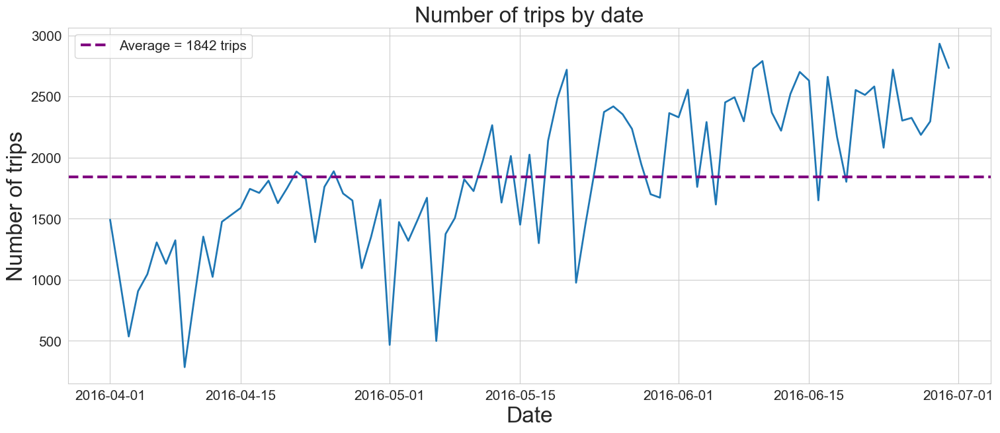

In [121]:
plt.figure(figsize=(18, 7))
plot = sns.lineplot(x="Date", y="Trips", data=ntd, linewidth=2)
plot.axhline(atpd, linestyle="--", color="purple", label=f"Average = {atpd} trips", linewidth=3)
plt.title("Number of trips by date", size=24)
plt.xlabel("Date", size=24)
plt.ylabel("Number of trips", size=24)
plt.legend(prop={'size': 15})
plt.xticks(size=15)
plt.yticks(size=15)
plt.show()

#### 4.2. Number of trips by day of week

#### Extracting day of week from Start Date column

In [122]:
df["day_of_week"] = df["start_date"].dt.day_name()

In [123]:
cats = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
tdw = df.groupby("day_of_week")["day_of_week"].agg(["count"]).reindex(cats).reset_index()
tdw.columns = ["Day Of Week", "Trips"]
tdw

,Day Of Week,Trips
0,Monday,24556
1,Tuesday,24489
2,Wednesday,26976
3,Thursday,26166
4,Friday,24593
5,Saturday,21454
6,Sunday,19376


#### Average trips per day of week

In [124]:
atdw = round(tdw["Trips"].mean())
print(f"Average trips per day of week: {atdw}")

Average trips per day of week: 23944


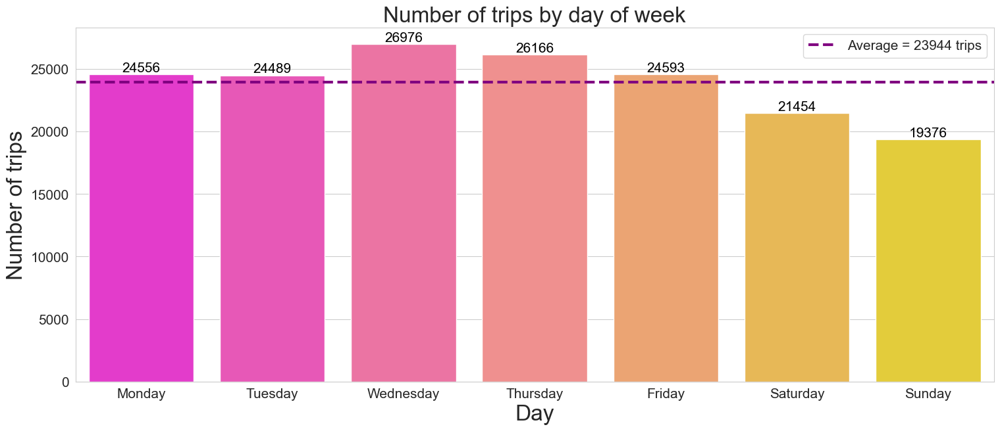

In [125]:
plt.figure(figsize=(18, 7))
plot = sns.barplot(x="Day Of Week", y="Trips", data=tdw, palette="spring")
for p in plot.patches:
    plot.annotate('{:.0f}'.format(p.get_height()),
                  (p.get_x() + 0.4, p.get_height()),
                  ha='center', va='bottom', color='black', size=15)
plot.axhline(atdw, linestyle="--", color="purple", label=f"Average = {atdw} trips", linewidth=3)
plt.title("Number of trips by day of week", size=24)
plt.xlabel("Day", size=24)
plt.ylabel("Number of trips", size=24)
plt.legend(prop={'size': 15})
plt.xticks(size=15)
plt.yticks(size=15)
plt.show()

#### 4.3. Distribution of trips over hours of the day

In [126]:
df["hour"] = pd.to_datetime(df["start_time"]).dt.hour

In [127]:
thd = df["hour"].value_counts().to_frame().reset_index()
thd.columns = ["Hour", "Trips"]
thd

,Hour,Trips
0,17,18853
1,18,14216
2,8,13045
3,16,12673
4,19,11194
5,15,10214
6,14,9339
7,13,8856
8,9,8640
9,12,8626


#### Average trips per hour

In [128]:
athd = round(thd["Trips"].mean())
print(f"Average trips per hour: {athd}")

Average trips per hour: 6984


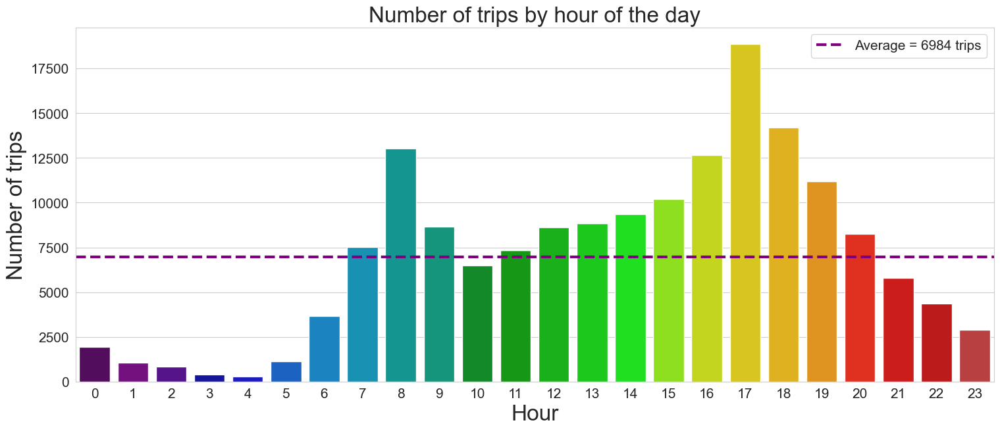

In [129]:
plt.figure(figsize=(18, 7))
plot = sns.barplot(x="Hour", y="Trips", data=thd, palette="nipy_spectral")
plot.axhline(athd, linestyle="--", color="purple", label=f"Average = {athd} trips", linewidth=3)
plt.title("Number of trips by hour of the day", size=24)
plt.xlabel("Hour", size=24)
plt.ylabel("Number of trips", size=24)
plt.legend(prop={'size': 15})
plt.xticks(size=15)
plt.yticks(size=15)
plt.show()

#### 4.4. Number of trips by start area

In [130]:
ntbsa = df["start_station_id"].value_counts().to_frame().reset_index()
ntbsa.columns = ["Start Station ID", "Trips"]
ntbsa

,Start Station ID,Trips
0,3023,6663
1,3021,5118
2,3010,4915
3,3045,4698
4,3032,4482
...,...,...
99,3109,156
100,3122,152
101,3104,146
102,3016,104


#### 4.5. Number of trips by destination area

In [131]:
ntbea = df["end_station_id"].value_counts().to_frame().reset_index()
ntbea.columns = ["End Station ID", "Trips"]
ntbea

,End Station ID,Trips
0,3023,7057
1,3021,5775
2,3045,4920
3,3010,4841
4,3032,4543
...,...,...
100,3109,121
101,3016,105
102,3104,103
103,3078,77


### 5. Average trip duration

In [132]:
df["trip_duration_in_min"] = df["duration"]/60
avd = round(df["trip_duration_in_min"].mean(), 2)
print(f"Average duration of trip: {avd} minutes")

Average duration of trip: 23.91 minutes


#### 6.1. Average trip duration by date

In [133]:
atdbd = df.groupby(["start_date"]).agg({"trip_duration_in_min": "mean"}).reset_index()
atdbd["trip_duration_in_min"] = round(atdbd["trip_duration_in_min"],2)
atdbd.columns = ["Date", "Trip Duration"]
atdbd.head()

,Date,Trip Duration
0,2016-04-01,22.09
1,2016-04-02,28.32
2,2016-04-03,19.54
3,2016-04-04,20.19
4,2016-04-05,18.65


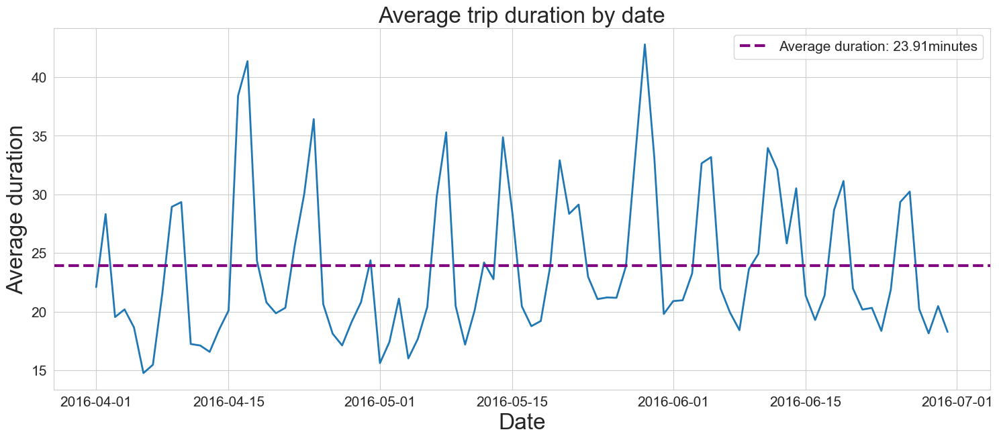

In [134]:
plt.figure(figsize=(18, 7))
plot = sns.lineplot(x="Date", y="Trip Duration", data=atdbd, linewidth=2)
plot.axhline(avd, linestyle="--", color="purple", label=f"Average duration: {avd}minutes", linewidth=3)
plt.title("Average trip duration by date", size=24)
plt.xlabel("Date", size=24)
plt.ylabel("Average duration", size=24)
plt.legend(prop={'size': 15})
plt.xticks(size=15)
plt.yticks(size=15)
plt.show()

#### 6.2. Average trip duration by day of week

In [135]:
adbd = df.groupby(["day_of_week"]).agg({"trip_duration_in_min": "mean"}).reset_index()
adbd.columns = ["Day Of Week", "Average Trip Duration"]
adbd["Average Trip Duration"] = round(adbd["Average Trip Duration"],2)
adbd

,Day Of Week,Average Trip Duration
0,Friday,23.80
1,Monday,22.29
2,Saturday,31.35
3,Sunday,32.91
4,Thursday,20.51
5,Tuesday,20.62
6,Wednesday,19.36


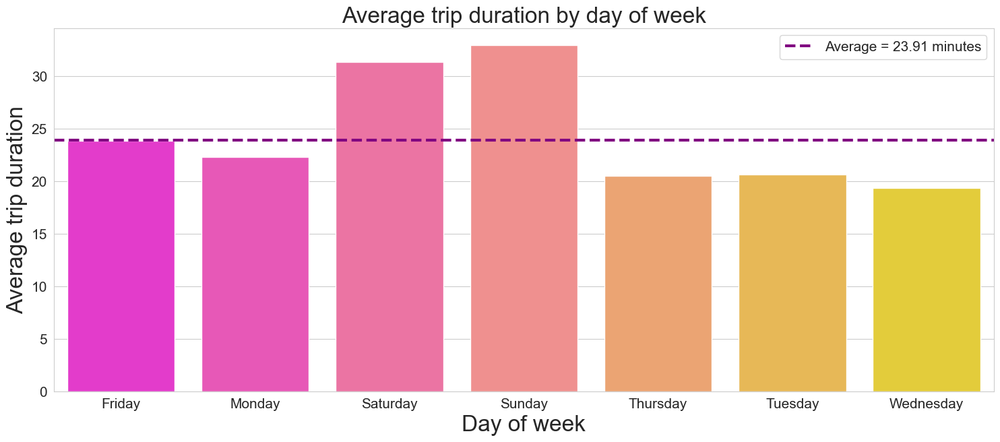

In [136]:
plt.figure(figsize=(18, 7))
plot = sns.barplot(x="Day Of Week", y="Average Trip Duration", data=adbd, palette="spring")
plot.axhline(avd, linestyle="--", color="purple", label=f"Average = {avd} minutes", linewidth=3)
plt.title("Average trip duration by day of week", size=24)
plt.xlabel("Day of week", size=24)
plt.ylabel("Average trip duration", size=24)
plt.legend(prop={'size': 15})
plt.xticks(size=15)
plt.yticks(size=15)
plt.show()

#### 6.3. Average trip duration by hour of the day

In [137]:
adbh = df.groupby(["hour"]).agg({"trip_duration_in_min": "mean"}).reset_index()
adbh.columns = ["Hour", "Average Trip Duration"]
adbh["Average Trip Duration"] = round(adbh["Average Trip Duration"],2)
adbh

,Hour,Average Trip Duration
0,0,40.09
1,1,43.34
2,2,46.61
3,3,44.09
4,4,24.14
5,5,16.32
6,6,15.16
7,7,14.97
8,8,15.13
9,9,19.83


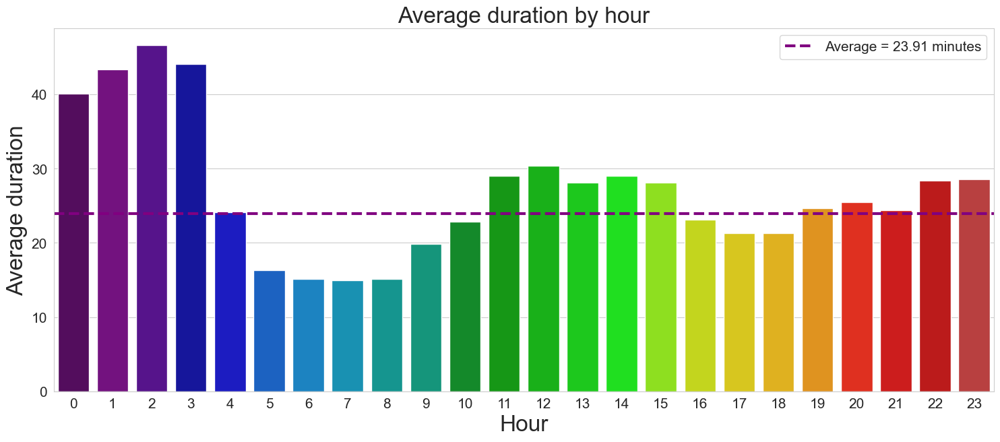

In [138]:
plt.figure(figsize=(18, 7))
plot = sns.barplot(x="Hour", y="Average Trip Duration", data=adbh, palette="nipy_spectral")
plot.axhline(avd, linestyle="--", color="purple", label=f"Average = {avd} minutes", linewidth=3)
plt.title("Average duration by hour", size=24)
plt.xlabel("Hour", size=24)
plt.ylabel("Average duration", size=24)
plt.legend(prop={'size': 15})
plt.xticks(size=15)
plt.yticks(size=15)
plt.show()

### 7. Trips statistics for first and last 15 days

#### First 15 days

In [139]:
ftd = df[(df["start_date"] >= "2016-04-01") & (df["start_date"] <= "2016-04-14")]
ftd["Time Period"] = "First 15 Days"

#### Last 15 days

In [140]:
ltd = df[(df["start_date"] >= "2016-06-17") & (df["start_date"] <= "2016-06-30")]
ltd["Time Period"] = "Last 15 Days"

In [141]:
fltd = pd.concat([ftd, ltd])

#### 7.1. Statistics by time period

In [142]:
fl_15 = fltd.groupby("Time Period").agg({"Time Period": "count",
                                         "trip_duration_in_min": "mean"})
fl_15.columns = ["Trips", "Trips Duration"]
fl_15["Trips Duration"] = round(fl_15["Trips Duration"], 2)
fl_15 = fl_15.reset_index()
fl_15

,Time Period,Trips,Trips Duration
0,First 15 Days,15258,19.77
1,Last 15 Days,33857,22.62


#### 7.2. Statistics by day of week and time period

In [143]:
fltdg = fltd.groupby(["day_of_week", "Time Period"]).agg({"Time Period": "count",
                                                          "trip_duration_in_min": "mean"})
fltdg["trip_duration_in_min"] = round(fltdg["trip_duration_in_min"],2)
fltdg.columns = ["Trips", "Trips Duration"]
fltdg = fltdg.reset_index()
fltdg

,day_of_week,Time Period,Trips,Trips Duration
0,Friday,First 15 Days,2815,21.86
1,Friday,Last 15 Days,5381,21.63
2,Monday,First 15 Days,2260,18.42
3,Monday,Last 15 Days,4739,21.16
4,Saturday,First 15 Days,1305,28.46
5,Saturday,Last 15 Days,4473,29.02
6,Sunday,First 15 Days,1365,25.49
7,Sunday,Last 15 Days,4127,30.63
8,Thursday,First 15 Days,2662,17.19
9,Thursday,Last 15 Days,4814,18.31


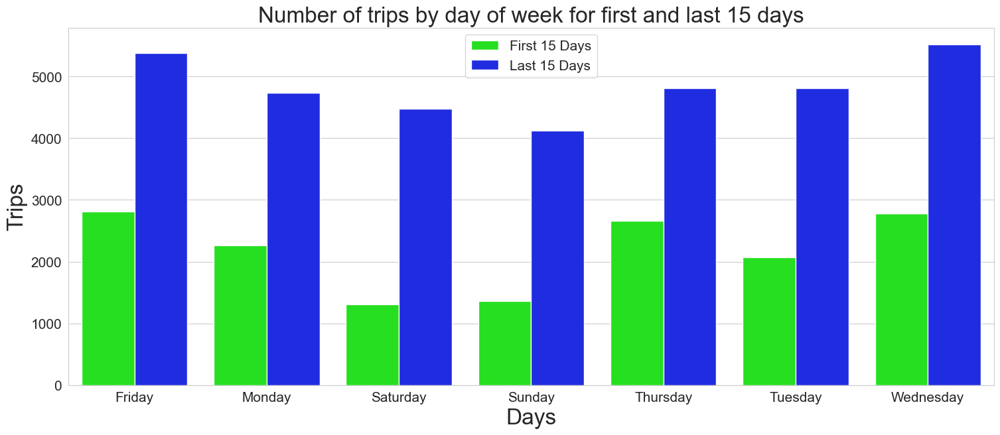

In [144]:
plt.figure(figsize=(18, 7))
sns.barplot(x="day_of_week", y="Trips", hue="Time Period", data=fltdg, palette="hsv")
plt.title("Number of trips by day of week for first and last 15 days", size=24)
plt.xlabel("Days", size=24)
plt.ylabel("Trips", size=24)
plt.legend(prop={'size': 15})
plt.xticks(size=15)
plt.yticks(size=15)
plt.show()

#### 7.3. Statistics by hour and time period

In [145]:
fltdh = fltd.groupby(["hour", "Time Period"])["Time Period"].agg(["count"]).reset_index()
fltdh.columns = ["Hour", "Time Period", "Trips"]
fltdh

,Hour,Time Period,Trips
0,0,First 15 Days,153
1,0,Last 15 Days,444
2,1,First 15 Days,77
3,1,Last 15 Days,253
4,2,First 15 Days,65
5,2,Last 15 Days,184
6,3,First 15 Days,26
7,3,Last 15 Days,74
8,4,First 15 Days,24
9,4,Last 15 Days,82


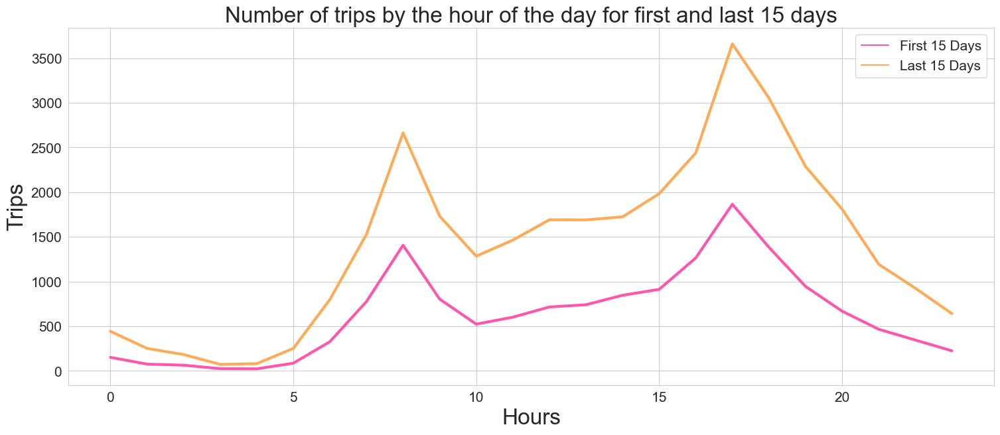

In [146]:
plt.figure(figsize=(18, 7))
sns.lineplot(x="Hour", y="Trips", hue="Time Period", data=fltdh, palette="spring", linewidth=3)
plt.title("Number of trips by the hour of the day for first and last 15 days", size=24)
plt.xlabel("Hours", size=24)
plt.ylabel("Trips", size=24)
plt.legend(prop={'size': 15})
plt.xticks(size=15)
plt.yticks(size=15)
plt.show()

### 8. Starts analysis


#### 8.1. Starts count on map

In [147]:
df_location_start = df[['start_lat', 'start_lon']].dropna()
df_location_start, counts_start = np.unique(df_location_start, return_counts=True, axis=0)
df_location_start = np.append(df_location_start, counts_start.reshape((df_location_start.shape[0], -1)), axis=1)

In [148]:
def draw_starts_number_map(data):
    location_start_map = folium.Map(location=[39.9539, -75.16902], zoom_start=13)
    for row in data:
        lat = row[0]
        long = row[1]
        count = row[2]
        radius = count / 3500
        color = "#FF4500"
        popup_text = """Latitude : {}<br>
                    Longitude : {}<br>
                    Starts numer : {}<br>"""
        popup_text = popup_text.format(lat, long, count)
        folium.CircleMarker(location=(lat, long), fill=True, radius=radius, popup=popup_text, color=color).add_to(
            location_start_map)
    return location_start_map


draw_starts_number_map(df_location_start)

#### 8.1. Put back location

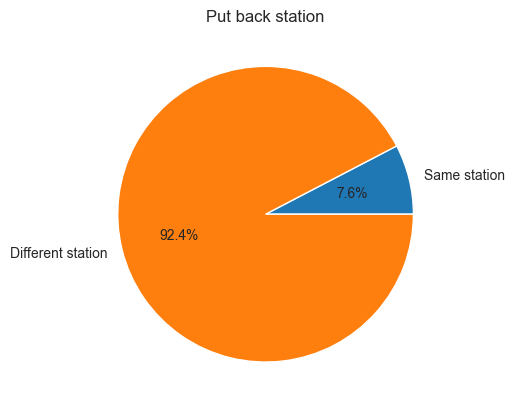

In [149]:
areas = df[["start_station_id", 'end_station_id']].value_counts().to_frame().reset_index()
areas.columns = ["start_station_id", 'end_station_id', "count"]
same_district = areas[(areas["start_station_id"] == areas['end_station_id'])].reset_index()
different_district = areas[(areas["start_station_id"] != areas['end_station_id'])].reset_index()

fig, ax = plt.subplots()
ax.pie([same_district["count"].sum(), different_district["count"].sum()],
       labels=["Same station", "Different station"], autopct='%1.1f%%')
plt.title("Put back station")
plt.show()

### 9. Traffic flow analysis


In [150]:
areas = df[["start_station_id", 'end_station_id']].dropna()
unique_areas = np.unique(areas)
area_count = unique_areas.shape[0]
areas_map = {}
for i, area_no in enumerate(unique_areas):
    areas_map[area_no] = i

different_district = areas[
    (areas["start_station_id"] != areas['end_station_id'])]  #.reset_index()

transfer_arr = np.zeros(shape=(area_count, area_count), dtype=np.int32)

for i, trip in enumerate(different_district.iloc):
    t0 = np.int(trip[0])
    t1 = np.int(trip[1])
    if t0 > t1:
        transfer_arr[areas_map[t0], areas_map[t1]] += 1
    else:
        transfer_arr[areas_map[t0], areas_map[t1]] -= 1

In [151]:
transfer_arr_norm = transfer_arr / np.linalg.norm(transfer_arr)
print(transfer_arr_norm.shape)

(105, 105)


In [152]:
area_geo_start_position = df[['start_station_id', 'start_lat', 'start_lon']].dropna()
area_geo_start_position = np.unique(area_geo_start_position, axis=0)
area_geo_end_position = df[['end_station_id', 'end_lat', 'end_lon']].dropna()
area_geo_end_position = np.unique(area_geo_end_position, axis=0)
area_geo_position = np.unique(np.concatenate((area_geo_start_position,area_geo_end_position),0), axis=0)

In [153]:
list_colors = [
    "#00FF00",
    "#12FF00",
    "#24FF00",
    "#35FF00",
    "#47FF00",
    "#58FF00",
    "#6AFF00",
    "#7CFF00",
    "#8DFF00",
    "#9FFF00",
    "#B0FF00",
    "#C2FF00",
    "#D4FF00",
    "#E5FF00",
    "#F7FF00",
    "#FFF600",
    "#FFE400",
    "#FFD300",
    "#FFC100",
    "#FFAF00",
    "#FF9E00",
    "#FF8C00",
    "#FF7B00",
    "#FF6900",
    "#FF5700",
    "#FF4600",
    "#FF3400",
    "#FF2300",
    "#FF1100",
    "#FF0000",
]
color_dict = {i: list_colors[i] for i in range(len(list_colors))}

In [154]:
def draw_flow_map(treshold=1):
    max_count = np.max(transfer_arr)
    print(max_count)
    location_start_map = folium.Map(location=[39.9539, -75.16902], zoom_start=12)
    for y in range(transfer_arr.shape[0]):
        for x in range(transfer_arr.shape[1]):
            if x > y and np.abs(transfer_arr[x, y]) > max_count * treshold:
                start_lat = area_geo_position[x, 1]
                start_long = area_geo_position[x, 2]
                end_lat = area_geo_position[y, 1]
                end_long = area_geo_position[y, 2]

                coordinates = [
                    [start_lat, start_long],
                    [end_lat, end_long]
                ]

                color = np.floor(np.log(np.abs(transfer_arr[x, y])) * (30 / np.ceil(np.log(max_count))))
                line = folium.PolyLine(locations=coordinates, weight=color / 2, color=color_dict[color])
                location_start_map.add_child(line)

                geodesic = Geod(ellps='WGS84')
                if transfer_arr[x, y] > 0:
                    rotation = geodesic.inv(start_long, start_lat, end_long, end_lat)[0] - 90
                    arrow_head = folium.RegularPolygonMarker(location=(
                    (end_lat - start_lat) * 0.95 + start_lat, (end_long - start_long) * 0.95 + start_long),
                                                             color=color_dict[color], number_of_sides=3,
                                                             radius=color * 0.75, rotation=rotation)
                else:
                    rotation = geodesic.inv(end_long, end_lat, start_long, start_lat)[0] - 90
                    arrow_head = folium.RegularPolygonMarker(
                        location=((start_lat - end_lat) * 0.95 + end_lat, (start_long - end_long) * 0.95 + end_long),
                        color=color_dict[color], number_of_sides=3, radius=color * 0.75, rotation=rotation)
                location_start_map.add_child(arrow_head)
    return location_start_map

In [155]:
draw_flow_map(0.01)

395


#### 9.1. Traffic flow - morning

In [156]:
def parseDateTime(dateTime: str, fromTime: int, toTime: int):
    result = []
    for dT in dateTime:
        tmp = dT.split()[1:3]
        hour = int(tmp[0].split(':')[0])
        if fromTime <= hour <= toTime:
            result.append(True)
        else:
            result.append(False)
    return np.array(result)

In [163]:
areas = df[["start_time", "start_station_id", "end_station_id"]].dropna()
district_filter = np.array(areas["start_station_id"] != areas['end_station_id'])
hour_filter = parseDateTime(areas['start_time'], 14, 18)
sum_filter = []
for i in range(len(district_filter)):
    if district_filter[i] == True and hour_filter[i] == True:
        sum_filter.append(True)
    else:
        sum_filter.append(False)
hour_district = np.array(areas[sum_filter])
transfer_arr = np.zeros(shape=(area_count, area_count), dtype=np.int32)

for i, trip in enumerate(hour_district):
    t0 = np.int(trip[1])
    t1 = np.int(trip[2])
    if t0 > t1:
        transfer_arr[areas_map[t0], areas_map[t1]] += 1
    else:
        transfer_arr[areas_map[t0], areas_map[t1]] -= 1

In [161]:
draw_flow_map(0.01)

235


#### 9.2. Traffic flow - afternoon


In [164]:
draw_flow_map(0.01)

204
